In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
import re

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D



### Examine data

In [5]:
# build data path relative to this script
df0 = pd.read_csv("../data/metrics_masks5_plus_full.csv")

df0 = df0.drop(columns=["image_path", "mask_path","scale_max_used"])
feature_cols = df0.columns[4:]


df0["Fungal_Strain"] = df0["plate"].str.split("_").str[1]
df0["Nitrogen_Level"] = df0["plate"].str.split("_").str[2]


In [6]:
with open("../data/results_nitrogen_update.pkl", "rb") as f:
    results_nitrogen_class = pickle.load(f)

print(type(results_nitrogen_class))   # should be dict

<class 'dict'>


In [7]:
cols = df0.columns
RGB_traits = [c for c in cols if re.match(r"^[RGB]_8bit_", c)]
HSV_traits = [c for c in cols if re.match(r"^[HSV]_", c)]
LAB_traits = [c for c in cols if re.match(r"^(L_|A_|LabB_)", c)]
Grey_traits = [c for c in cols if c.startswith("Gray_8bit_")]
Ncolor_traits = ['area_pixels', 'circularity',
       'contour_count', 'hull_area', 'max_width', 'min_width', 'perimeter',
       'rect_angle_deg', 'solidity']
trait_sets = {
    "RGB": RGB_traits,
    "HSV": HSV_traits,
    "LAB": LAB_traits,
    "Grey": Grey_traits,
    "Ncolor": Ncolor_traits
}

In [8]:
# Reorder traits by category: [Ncolor_traits, Grey_traits, RGB_traits, HSV_traits, LAB_traits]
trait_order = Ncolor_traits + Grey_traits + RGB_traits + HSV_traits + LAB_traits


In [9]:
results_nitrogen_class.keys()

dict_keys([('overhead', 'all', '2024-12-21'), ('overhead', 'all', '2024-12-22'), ('overhead', 'all', '2024-12-23'), ('overhead', 'all', '2024-12-24'), ('overhead', 'all', '2024-12-25'), ('overhead', 'all', '2024-12-26'), ('overhead', 'all', '2024-12-27'), ('overhead', 'all', '2024-12-28'), ('overhead', 'all', '2024-12-29'), ('overhead', 'all', '2024-12-30'), ('overhead', 'all', '2024-12-31'), ('overhead', 'plug', '2024-12-21'), ('overhead', 'plug', '2024-12-22'), ('overhead', 'plug', '2024-12-23'), ('overhead', 'plug', '2024-12-24'), ('overhead', 'plug', '2024-12-25'), ('overhead', 'plug', '2024-12-26'), ('overhead', 'plug', '2024-12-27'), ('overhead', 'plug', '2024-12-28'), ('overhead', 'plug', '2024-12-29'), ('overhead', 'plug', '2024-12-30'), ('overhead', 'plug', '2024-12-31'), ('overhead', 'all_plug', '2024-12-21'), ('overhead', 'all_plug', '2024-12-22'), ('overhead', 'all_plug', '2024-12-23'), ('overhead', 'all_plug', '2024-12-24'), ('overhead', 'all_plug', '2024-12-25'), ('overhe

In [10]:
hypter_dict = {k: v[0] for k, v in results_nitrogen_class.items()}


### Random forest importance

In [11]:
RESULTS_DIR = "../results/nitrogen_class/RF"

imp_RF_df  = pd.read_parquet(f"{RESULTS_DIR}/nitrogen_importance_RF_importances.parquet", engine="fastparquet")
fold_RF_df = pd.read_parquet(f"{RESULTS_DIR}/nitrogen_importance_RF_fold_metrics.parquet", engine="fastparquet")
summary_RF_df = pd.read_csv(f"{RESULTS_DIR}/nitrogen_importance_RF_summaries.csv")

print("importances shape :", imp_RF_df.shape)
print("fold_metrics shape:", fold_RF_df.shape)
print("summaries shape   :", summary_RF_df.shape)
print("\nCombinations in importances:")


importances shape : (2596, 9)
fold_metrics shape: (220, 10)
summaries shape   : (44, 10)

Combinations in importances:


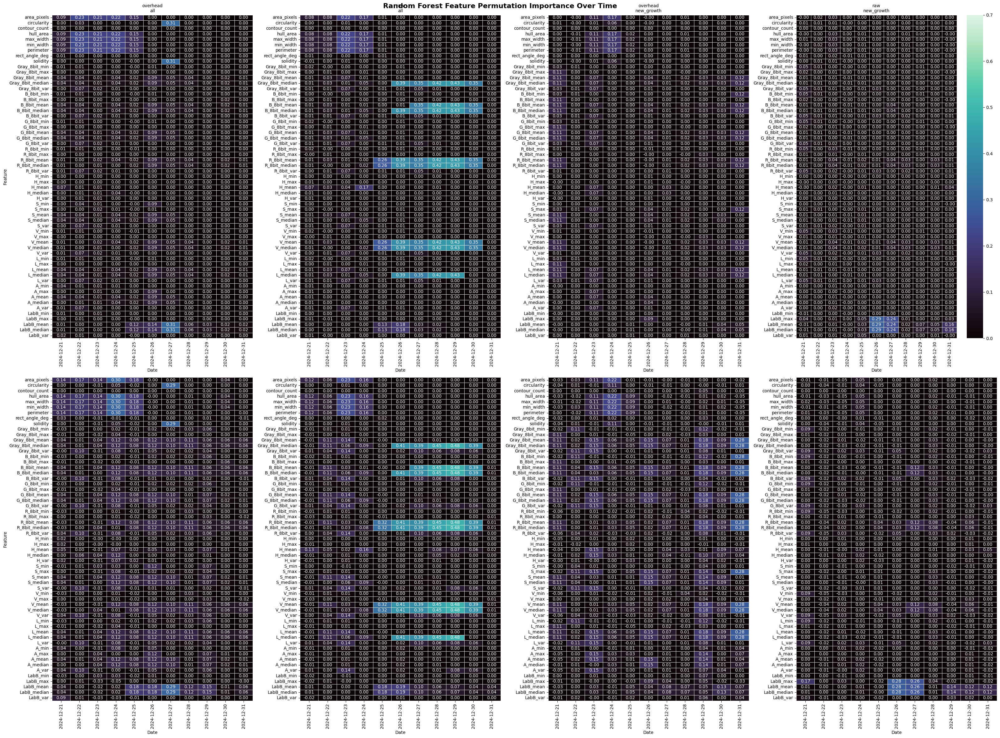

In [12]:
#region plotting

datasets = []

for mask_type in imp_RF_df["mask_type"].unique():
    for view_direction in imp_RF_df["view"].unique():

        subset = imp_RF_df[
            (imp_RF_df["view"] == view_direction) &
            (imp_RF_df["mask_type"] == mask_type)
        ]

        if not subset.empty:
            datasets.append((view_direction, mask_type, subset))

n = len(datasets)

fig, axes = plt.subplots(2, n, figsize=(8*n, 24))

for i, (view_direction, mask_type, subset) in enumerate(datasets):

    # pivot
    train = subset.pivot(
        index="feature_name",
        columns="date",
        values="mean_importance_train"
    )

    test = subset.pivot(
        index="feature_name",
        columns="date",
        values="mean_importance_test"
    )

    train = train[sorted(train.columns)]
    test = test[sorted(test.columns)]

    trait_order_use = [t for t in trait_order if t in train.index]

    train = train.loc[trait_order_use]
    test = test.loc[trait_order_use]

    # -------- Training heatmap --------
    sns.heatmap(
        train,
        annot=True,
        fmt=".2f",
        cmap="mako",
        linewidths=0.5,
        linecolor="white",
        vmin=0,
        vmax=0.7,
        cbar=(i == n-1),
        ax=axes[0, i]
    )

    axes[0, i].set_title(f"{view_direction}\n{mask_type}", fontsize=10)
    axes[0, i].set_xlabel("Date")
    axes[0, i].set_ylabel("Feature" if i == 0 else "")

    # -------- Testing heatmap --------
    sns.heatmap(
        test,
        annot=True,
        fmt=".2f",
        cmap="mako",
        linewidths=0.5,
        linecolor="white",
        vmin=0,
        vmax=0.7,
        cbar=False,
        ax=axes[1, i]
    )

    axes[1, i].set_xlabel("Date")
    axes[1, i].set_ylabel("Feature" if i == 0 else "")


fig.suptitle(
    "Random Forest Feature Permutation Importance Over Time",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.show()
#endregion


In [13]:
mask_order = ["all", "plug", "all_plug", "new_growth", "old_growth"]
mask_palette = dict(zip(mask_order, sns.color_palette("husl", len(mask_order))))

view_order = ["raw", "overhead"]
view_linestyles = {"raw": "-", "overhead": "--"}


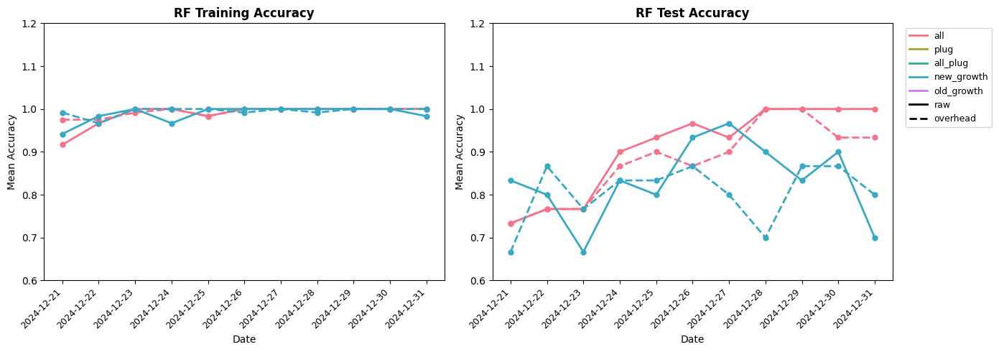

In [14]:
#region plotting
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for mask_type in mask_order:
    for view_direction in view_order:
        subset = summary_RF_df[
            (summary_RF_df["mask_type"] == mask_type) &
            (summary_RF_df["view"] == view_direction)
        ].sort_values("date")

        if subset.empty:
            continue

        label = f"{mask_type} / {view_direction}"
        color = mask_palette[mask_type]
        ls = view_linestyles[view_direction]

        axes[0].plot(
            subset["date"], subset["mean_train_acc"],
            marker="o", color=color, linestyle=ls, linewidth=2, markersize=5, label=label
        )
        axes[1].plot(
            subset["date"], subset["mean_test_acc"],
            marker="o", color=color, linestyle=ls, linewidth=2, markersize=5, label=label
        )

for ax, title in zip(axes, ["RF Training Accuracy", "RF Test Accuracy"]):
    ax.set_title(title, fontsize=12, fontweight="bold")
    ax.set_xlabel("Date", fontsize=10)
    ax.set_ylabel("Mean Accuracy", fontsize=10)
    ax.set_ylim(0.6, 1.2)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=9)

# Build legend: color patches for mask_type, linestyle handles for view
legend_handles = []
for mask_type in mask_order:
    legend_handles.append(
        Line2D([0], [0], color=mask_palette[mask_type], linewidth=2, label=mask_type)
    )
for view_direction, ls in view_linestyles.items():
    legend_handles.append(
        Line2D([0], [0], color="black", linestyle=ls, linewidth=2, label=view_direction)
    )

axes[1].legend(handles=legend_handles, bbox_to_anchor=(1.02, 1), loc="upper left", fontsize=9)

plt.tight_layout()
plt.show()
#endregion


### Elastic Net

#### Permutation Importance

In [15]:
RESULTS_DIR = "../results/nitrogen_class/ElasticNet_MultinomialLR"

imp_EN_df  = pd.read_parquet(f"{RESULTS_DIR}/nitrogen_importance_ElasticNet_importances.parquet", engine="fastparquet")
fold_EN_df = pd.read_parquet(f"{RESULTS_DIR}/nitrogen_importance_ElasticNet_fold_metrics.parquet", engine="fastparquet")
summary_EN_df = pd.read_csv(f"{RESULTS_DIR}/nitrogen_importance_ElasticNet_summaries.csv")

print("importances shape :", imp_EN_df.shape)
print("fold_metrics shape:", fold_EN_df.shape)
print("summaries shape   :", summary_EN_df.shape)


importances shape : (2596, 9)
fold_metrics shape: (220, 10)
summaries shape   : (44, 10)


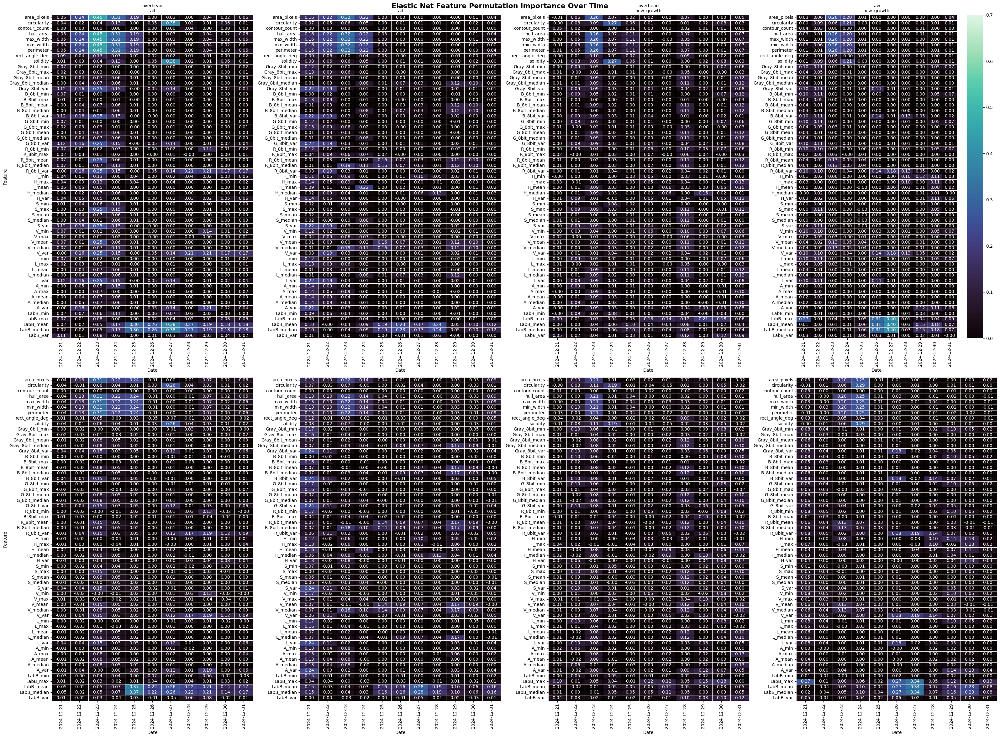

In [ ]:
#region plotting
datasets = []

for mask_type in imp_EN_df["mask_type"].unique():
    for view_direction in imp_EN_df["view"].unique():

        subset = imp_EN_df[
            (imp_EN_df["view"] == view_direction) &
            (imp_EN_df["mask_type"] == mask_type)
        ]

        if not subset.empty:
            datasets.append((view_direction, mask_type, subset))

n = len(datasets)

fig, axes = plt.subplots(2, n, figsize=(8*n, 24))

for i, (view_direction, mask_type, subset) in enumerate(datasets):

    # pivot
    train = subset.pivot(
        index="feature_name",
        columns="date",
        values="mean_importance_train"
    )

    test = subset.pivot(
        index="feature_name",
        columns="date",
        values="mean_importance_test"
    )

    train = train[sorted(train.columns)]
    test = test[sorted(test.columns)]

    trait_order_use = [t for t in trait_order if t in train.index]

    train = train.loc[trait_order_use]
    test = test.loc[trait_order_use]

    # -------- Training heatmap --------
    sns.heatmap(
        train,
        annot=True,
        fmt=".2f",
        cmap="mako",
        linewidths=0.5,
        linecolor="white",
        vmin=0,
        vmax=0.7,
        cbar=(i == n-1),
        ax=axes[0, i]
    )

    axes[0, i].set_title(f"{view_direction}\n{mask_type}", fontsize=10)
    axes[0, i].set_xlabel("Date")
    axes[0, i].set_ylabel("Feature" if i == 0 else "")

    # -------- Testing heatmap --------
    sns.heatmap(
        test,
        annot=True,
        fmt=".2f",
        cmap="mako",
        linewidths=0.5,
        linecolor="white",
        vmin=0,
        vmax=0.7,
        cbar=False,
        ax=axes[1, i]
    )

    axes[1, i].set_xlabel("Date")
    axes[1, i].set_ylabel("Feature" if i == 0 else "")


fig.suptitle(
    "Elastic Net Feature Permutation Importance Over Time",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.savefig("../results/nitrogen_feature_importance/feature_importance_over_time_nitrogen_color.pdf", format="pdf", dpi=300, bbox_inches="tight")
plt.show()
#endregion

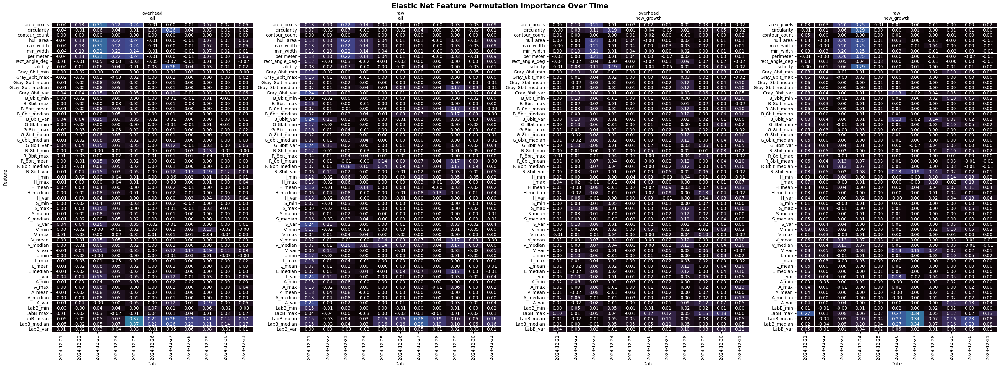

In [17]:

#region plotting
datasets = []

for mask_type in imp_EN_df["mask_type"].unique():
    for view_direction in imp_EN_df["view"].unique():

        subset = imp_EN_df[
            (imp_EN_df["view"] == view_direction) &
            (imp_EN_df["mask_type"] == mask_type)
        ]

        if not subset.empty:
            datasets.append((view_direction, mask_type, subset))

n = len(datasets)

fig, axes = plt.subplots(1, n, figsize=(8*n, 12))

if n == 1:
    axes = [axes]

for i, (view_direction, mask_type, subset) in enumerate(datasets):

    # pivot
    test = subset.pivot(
        index="feature_name",
        columns="date",
        values="mean_importance_test"
    )

    test = test[sorted(test.columns)]

    trait_order_use = [t for t in trait_order if t in test.index]
    test = test.loc[trait_order_use]

    # -------- Testing heatmap --------
    sns.heatmap(
        test,
        annot=True,
        fmt=".2f",
        cmap="mako",
        linewidths=0.5,
        linecolor="white",
        vmin=0,
        vmax=0.7,
        cbar=False,
        ax=axes[i]
    )

    axes[i].set_title(f"{view_direction}\n{mask_type}", fontsize=10)
    axes[i].set_xlabel("Date")
    axes[i].set_ylabel("Feature" if i == 0 else "")


fig.suptitle(
    "Elastic Net Feature Permutation Importance Over Time",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.show()
#endregion


#### Coef Importance

In [18]:
RESULTS_DIR = "../results/nitrogen_class/ElasticNet_MultinomialLR"

imp_coef_elastic_df  = pd.read_parquet(f"{RESULTS_DIR}/nitrogen_imp_coef_ElasticNet_MultinomialLR.parquet", engine="fastparquet")
class_coef_elastic_df = pd.read_parquet(f"{RESULTS_DIR}/nitrogen_imp_coef_ElasticNet_MultinomialLR_per_class.parquet", engine="fastparquet")
summary_elastic_df = pd.read_csv(f"{RESULTS_DIR}/nitrogen_imp_coef_ElasticNet_MultinomialLR_summaries.csv")

print("importances shape :", imp_coef_elastic_df.shape)
print("class coefficients shape:", class_coef_elastic_df.shape)
print("summaries shape   :", summary_elastic_df.shape)

importances shape : (6490, 6)
class coefficients shape: (1650, 64)
summaries shape   : (110, 11)


In [19]:
imp_coef_elastic_df

,feature_name,mean_importance,std_importance,view,mask_type,date
0,LabB_var,0.383872,0.444295,overhead,all,2024-12-21
1,rect_angle_deg,0.328065,0.302020,overhead,all,2024-12-21
2,LabB_max,0.324088,0.387553,overhead,all,2024-12-21
3,H_mean,0.236032,0.162471,overhead,all,2024-12-21
4,H_var,0.200852,0.124784,overhead,all,2024-12-21
...,...,...,...,...,...,...
6485,A_median,0.000000,0.000000,raw,old_growth,2024-12-31
6486,S_median,0.000000,0.000000,raw,old_growth,2024-12-31
6487,S_mean,0.000000,0.000000,raw,old_growth,2024-12-31
6488,G_8bit_max,0.000000,0.000000,raw,old_growth,2024-12-31


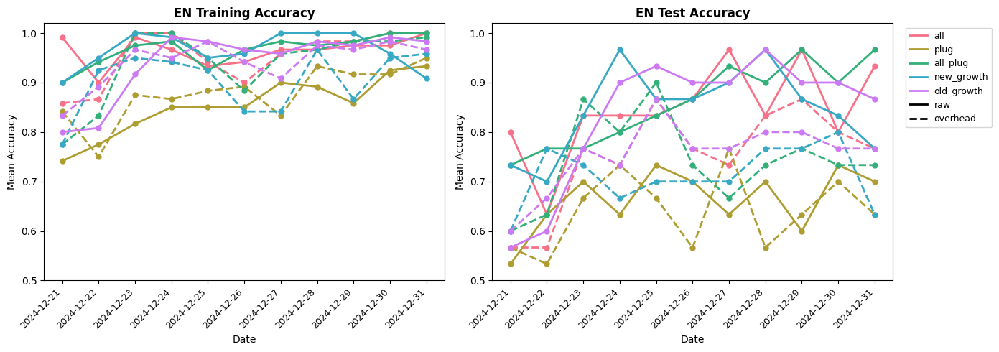

In [20]:
#region plotting
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for mask_type in mask_order:
    for view_direction in view_order:
        subset = summary_elastic_df[
            (summary_elastic_df["mask_type"] == mask_type) &
            (summary_elastic_df["view"] == view_direction)
        ].sort_values("date")

        if subset.empty:
            continue

        label = f"{mask_type} / {view_direction}"
        color = mask_palette[mask_type]
        ls = view_linestyles[view_direction]

        axes[0].plot(
            subset["date"], subset["mean_train_acc"],
            marker="o", color=color, linestyle=ls, linewidth=2, markersize=5, label=label
        )
        axes[1].plot(
            subset["date"], subset["mean_test_acc"],
            marker="o", color=color, linestyle=ls, linewidth=2, markersize=5, label=label
        )

for ax, title in zip(axes, ["EN Training Accuracy", "EN Test Accuracy"]):
    ax.set_title(title, fontsize=12, fontweight="bold")
    ax.set_xlabel("Date", fontsize=10)
    ax.set_ylabel("Mean Accuracy", fontsize=10)
    ax.set_ylim(0.5, 1.02)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=9)

# Build legend: color patches for mask_type, linestyle handles for view
legend_handles = []
for mask_type in mask_order:
    legend_handles.append(
        Line2D([0], [0], color=mask_palette[mask_type], linewidth=2, label=mask_type)
    )
for view_direction, ls in view_linestyles.items():
    legend_handles.append(
        Line2D([0], [0], color="black", linestyle=ls, linewidth=2, label=view_direction)
    )

axes[1].legend(handles=legend_handles, bbox_to_anchor=(1.02, 1), loc="upper left", fontsize=9)

plt.tight_layout()
plt.show()
#endregion


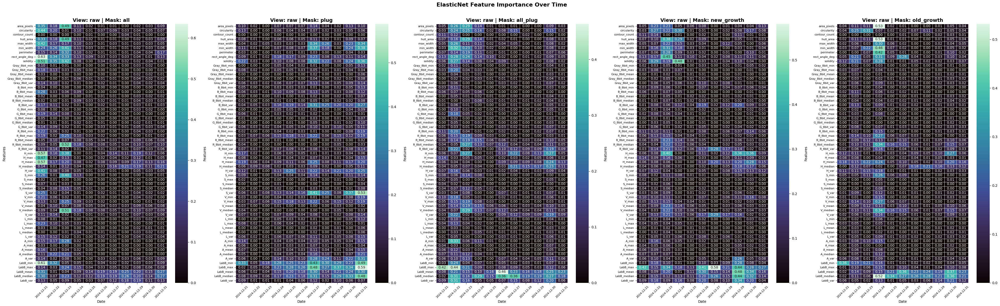

In [25]:
#views = imp_coef_elastic_df["view"].unique()
views = ["raw"]
masks = imp_coef_elastic_df["mask_type"].unique()

fig, axes = plt.subplots(
    nrows=len(views), 
    ncols=len(masks), 
    figsize=(8 * len(masks), 12 * len(views))
)

# Ensure axes is always 2D
if len(views) == 1 and len(masks) == 1:
    axes = [[axes]]
elif len(views) == 1:
    axes = [axes]
elif len(masks) == 1:
    axes = [[ax] for ax in axes]

for row_idx, view_direction in enumerate(views):
    for col_idx, mask_type in enumerate(masks):
        ax = axes[row_idx][col_idx]

        imp_elastic_df_example = imp_coef_elastic_df[
            (imp_coef_elastic_df["view"] == view_direction) & 
            (imp_coef_elastic_df["mask_type"] == mask_type)
        ].copy()

        elastic_pivot = imp_elastic_df_example.pivot(
            index='feature_name', columns='date', values='mean_importance'
        )
        elastic_pivot = elastic_pivot[sorted(elastic_pivot.columns)]
        elastic_pivot_ordered = elastic_pivot.loc[trait_order]

        sns.heatmap(
            elastic_pivot_ordered,
            annot=True,
            fmt=".2f",
            cmap="mako",
            linewidths=0.5,
            linecolor="white",
            ax=ax
        )

        ax.set_title(f"View: {view_direction} | Mask: {mask_type}", 
                     fontsize=14, fontweight='bold')
        ax.set_ylabel("Features", fontsize=10)
        ax.set_xlabel("Date", fontsize=10)
        ax.tick_params(axis='x', rotation=45, labelsize=8)
        ax.tick_params(axis='y', rotation=0, labelsize=8)

plt.suptitle("ElasticNet Feature Importance Over Time", 
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("../results/nitrogen_class/feature_importance_over_time_nitrogen_EN.pdf", format="pdf", dpi=300, bbox_inches="tight")
plt.show()

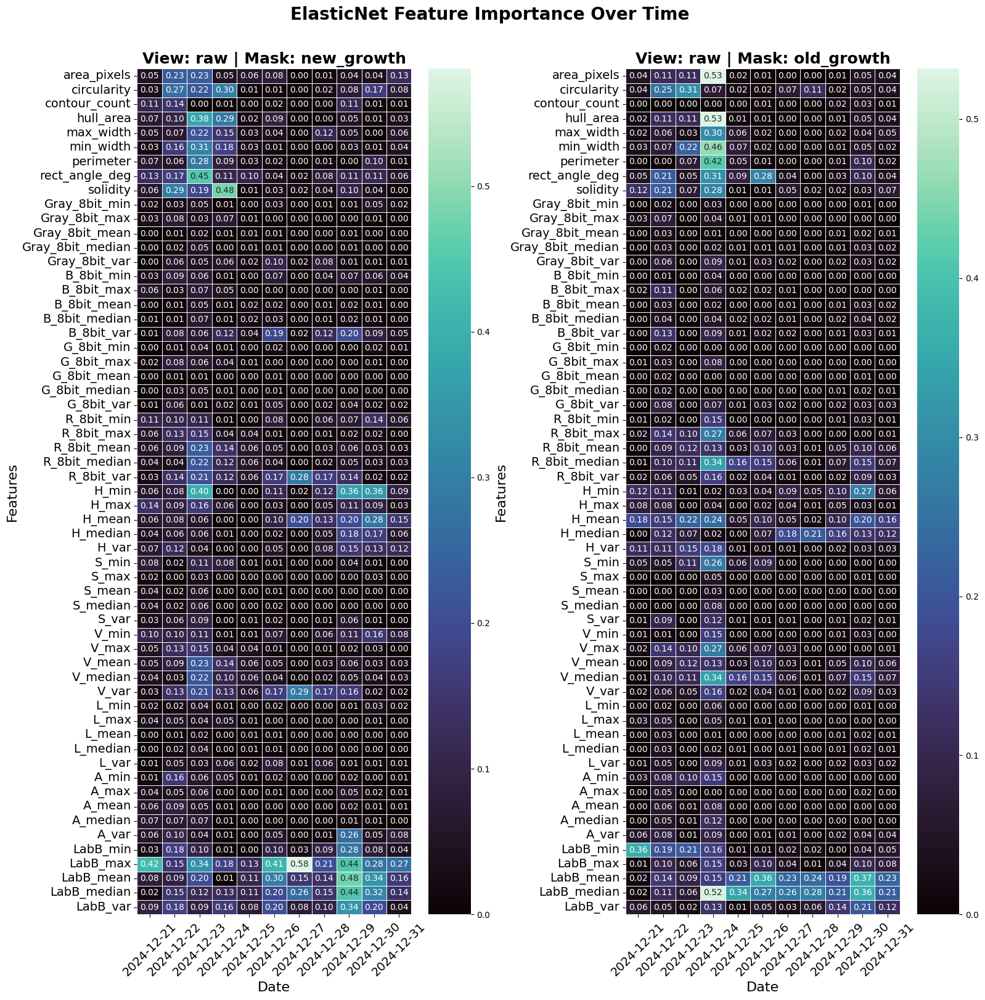

In [22]:
views = ["raw"]
masks = [#"all", "all_plug",
    "new_growth", "old_growth"]
FONTSIZE =16
fig, axes = plt.subplots(
    nrows=len(views), 
    ncols=len(masks), 
    figsize=(8 * len(masks), 16 * len(views))
)

# Ensure axes is always 2D
if len(views) == 1 and len(masks) == 1:
    axes = [[axes]]
elif len(views) == 1:
    axes = [axes]
elif len(masks) == 1:
    axes = [[ax] for ax in axes]

for row_idx, view_direction in enumerate(views):
    for col_idx, mask_type in enumerate(masks):
        ax = axes[row_idx][col_idx]

        imp_elastic_df_example = imp_coef_elastic_df[
            (imp_coef_elastic_df["view"] == view_direction) & 
            (imp_coef_elastic_df["mask_type"] == mask_type)
        ].copy()

        elastic_pivot = imp_elastic_df_example.pivot(
            index='feature_name', columns='date', values='mean_importance'
        )
        elastic_pivot = elastic_pivot[sorted(elastic_pivot.columns)]
        elastic_pivot_ordered = elastic_pivot.loc[trait_order]

        sns.heatmap(
            elastic_pivot_ordered,
            annot=True,
            fmt=".2f",
            cmap="mako",
            linewidths=0.5,
            linecolor="white",
            ax=ax
        )

        ax.set_title(f"View: {view_direction} | Mask: {mask_type}", 
                     fontsize=FONTSIZE + 2, fontweight='bold')
        ax.set_ylabel("Features", fontsize=FONTSIZE)
        ax.set_xlabel("Date", fontsize=FONTSIZE)
        ax.tick_params(axis='x', rotation=45, labelsize=FONTSIZE - 2)
        ax.tick_params(axis='y', rotation=0, labelsize=FONTSIZE - 2)

plt.suptitle("ElasticNet Feature Importance Over Time", 
             fontsize=FONTSIZE + 4, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

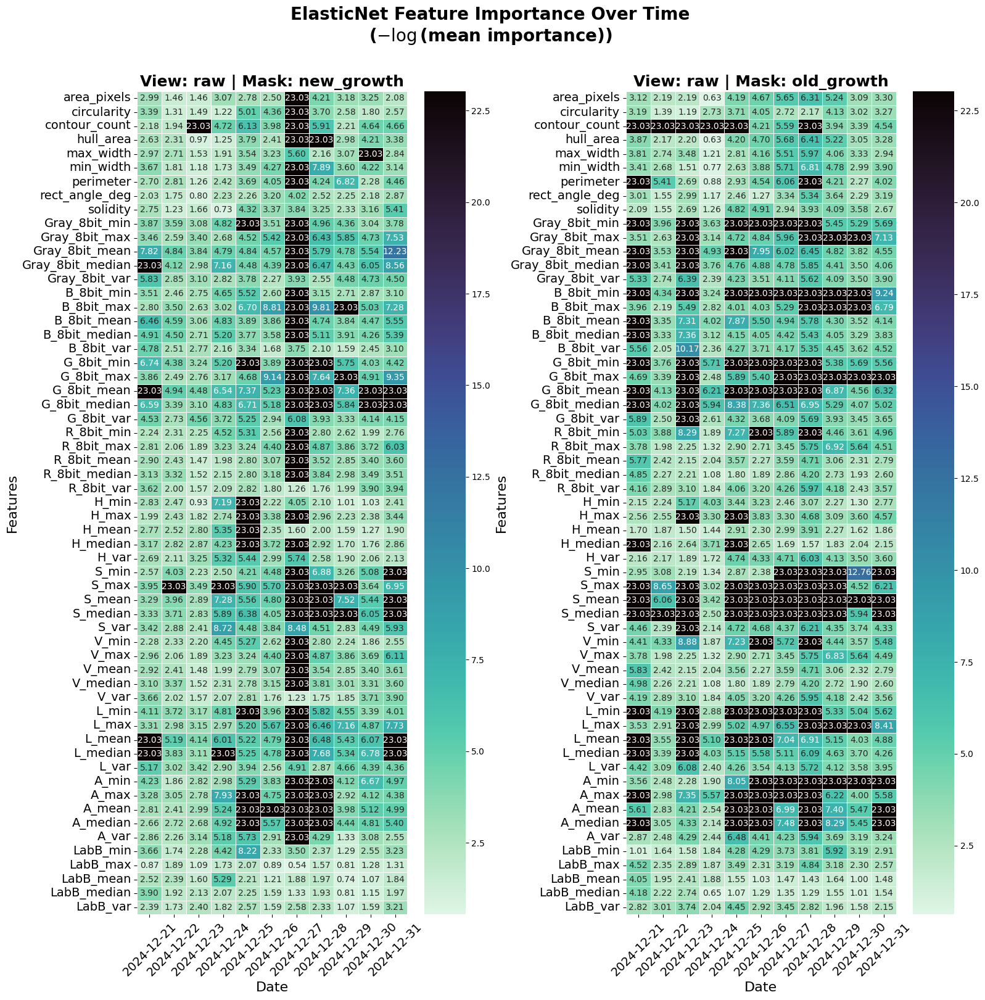

In [23]:
views = ["raw"]
masks = [#"all", "all_plug",
    "new_growth", "old_growth"]
FONTSIZE = 16
fig, axes = plt.subplots(
    nrows=len(views), 
    ncols=len(masks), 
    figsize=(8 * len(masks), 16 * len(views))
)

# Ensure axes is always 2D
if len(views) == 1 and len(masks) == 1:
    axes = [[axes]]
elif len(views) == 1:
    axes = [axes]
elif len(masks) == 1:
    axes = [[ax] for ax in axes]

for row_idx, view_direction in enumerate(views):
    for col_idx, mask_type in enumerate(masks):
        ax = axes[row_idx][col_idx]

        imp_elastic_df_example = imp_coef_elastic_df[
            (imp_coef_elastic_df["view"] == view_direction) & 
            (imp_coef_elastic_df["mask_type"] == mask_type)
        ].copy()

        elastic_pivot = imp_elastic_df_example.pivot(
            index='feature_name', columns='date', values='mean_importance'
        )
       
        elastic_pivot = elastic_pivot[sorted(elastic_pivot.columns)]
        elastic_pivot_ordered = elastic_pivot.loc[trait_order]

        # Compute -log(mean_importance), clipping to avoid log(0)
        # Use reversed colormap so high importance (low -log value) is bright
        neg_log_pivot = -np.log(elastic_pivot_ordered.clip(lower=1e-10))
        sns.heatmap(
            neg_log_pivot,
            annot=True,
            fmt=".2f",
            cmap="mako_r",
            linewidths=0.5,
            linecolor="white",
            ax=ax
        )

        ax.set_title(f"View: {view_direction} | Mask: {mask_type}", 
                     fontsize=FONTSIZE + 2, fontweight='bold')
        ax.set_ylabel("Features", fontsize=FONTSIZE)
        ax.set_xlabel("Date", fontsize=FONTSIZE)
        ax.tick_params(axis='x', rotation=45, labelsize=FONTSIZE - 2)
        ax.tick_params(axis='y', rotation=0, labelsize=FONTSIZE - 2)

plt.suptitle("ElasticNet Feature Importance Over Time\n($-\\log$(mean importance))", 
             fontsize=FONTSIZE + 4, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()


### Lasso

#### Permutation Importance

In [81]:
RESULTS_DIR = "../results/nitrogen_class/Lasso_MultinomialLR"

imp_lasso_df  = pd.read_parquet(f"{RESULTS_DIR}/nitrogen_importance_Lasso_MultinomialLR_importances.parquet", engine="fastparquet")
fold_lasso_df = pd.read_parquet(f"{RESULTS_DIR}/nitrogen_importance_Lasso_MultinomialLR_fold_metrics.parquet", engine="fastparquet")
summary_lasso_df = pd.read_csv(f"{RESULTS_DIR}/nitrogen_importance_Lasso_MultinomialLR_summaries.csv")

print("importances shape :", imp_lasso_df.shape)
print("fold_metrics shape:", fold_lasso_df.shape)
print("summaries shape   :", summary_lasso_df.shape)


importances shape : (2596, 9)
fold_metrics shape: (220, 10)
summaries shape   : (44, 10)


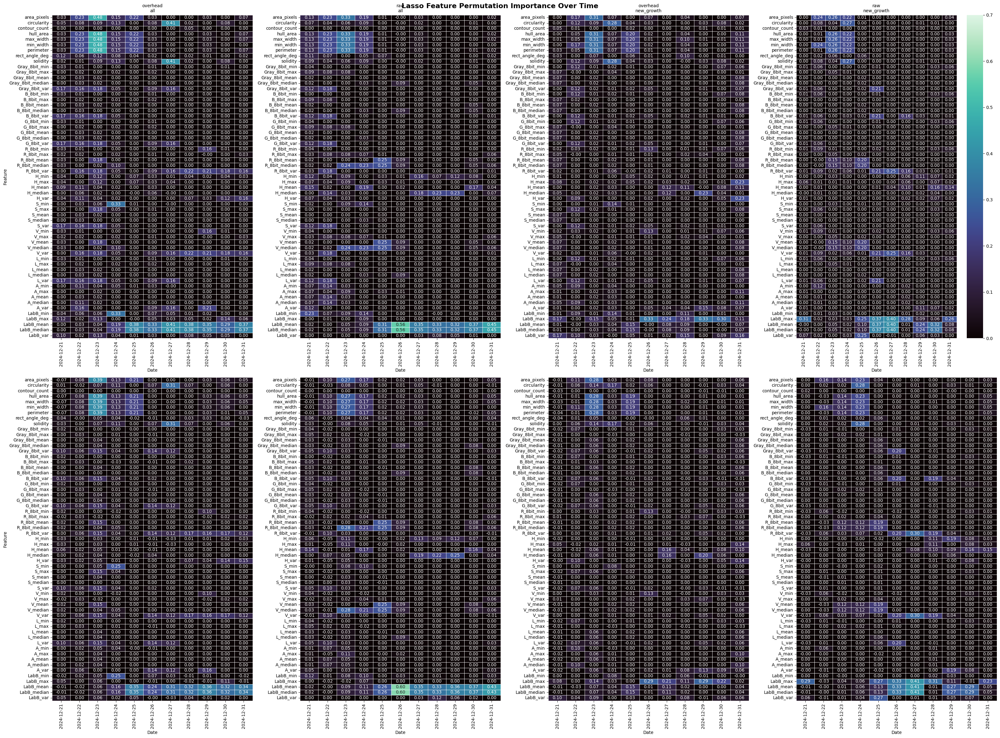

In [ ]:
#region plotting
datasets = []

for mask_type in imp_lasso_df["mask_type"].unique():
    for view_direction in imp_lasso_df["view"].unique():

        subset = imp_lasso_df[
            (imp_lasso_df["view"] == view_direction) &
            (imp_lasso_df["mask_type"] == mask_type)
        ]

        if not subset.empty:
            datasets.append((view_direction, mask_type, subset))

n = len(datasets)

fig, axes = plt.subplots(2, n, figsize=(8*n, 24))

for i, (view_direction, mask_type, subset) in enumerate(datasets):

    # pivot
    train = subset.pivot(
        index="feature_name",
        columns="date",
        values="mean_importance_train"
    )

    test = subset.pivot(
        index="feature_name",
        columns="date",
        values="mean_importance_test"
    )

    train = train[sorted(train.columns)]
    test = test[sorted(test.columns)]

    trait_order_use = [t for t in trait_order if t in train.index]

    train = train.loc[trait_order_use]
    test = test.loc[trait_order_use]

    # -------- Training heatmap --------
    sns.heatmap(
        train,
        annot=True,
        fmt=".2f",
        cmap="mako",
        linewidths=0.5,
        linecolor="white",
        vmin=0,
        vmax=0.7,
        cbar=(i == n-1),
        ax=axes[0, i]
    )

    axes[0, i].set_title(f"{view_direction}\n{mask_type}", fontsize=10)
    axes[0, i].set_xlabel("Date")
    axes[0, i].set_ylabel("Feature" if i == 0 else "")

    # -------- Testing heatmap --------
    sns.heatmap(
        test,
        annot=True,
        fmt=".2f",
        cmap="mako",
        linewidths=0.5,
        linecolor="white",
        vmin=0,
        vmax=0.7,
        cbar=False,
        ax=axes[1, i]
    )

    axes[1, i].set_xlabel("Date")
    axes[1, i].set_ylabel("Feature" if i == 0 else "")


fig.suptitle(
    "Lasso Feature Permutation Importance Over Time",
    fontsize=16,
    fontweight="bold"
)

plt.tight_layout()
plt.show()
#endregion

#### Coefficient importance

In [84]:
RESULTS_DIR = "../results/nitrogen_class/Lasso_MultinomialLR"

imp_coef_lasso_df  = pd.read_parquet(f"{RESULTS_DIR}/nitrogen_imp_coef_Lasso_MultinomialLR.parquet", engine="fastparquet")
class_coef_lasso_df = pd.read_parquet(f"{RESULTS_DIR}/nitrogen_imp_coef_Lasso_MultinomialLR_per_class.parquet", engine="fastparquet")
summary_lasso_df = pd.read_csv(f"{RESULTS_DIR}/nitrogen_imp_coef_Lasso_MultinomialLR_summaries.csv")

print("importances shape :", imp_coef_lasso_df.shape)
print("class coefficients shape:", class_coef_lasso_df.shape)
print("summaries shape   :", summary_lasso_df.shape)


importances shape : (6490, 6)
class coefficients shape: (1650, 64)
summaries shape   : (110, 11)


In [85]:

imp_lasso_df_example = imp_coef_lasso_df[(imp_coef_lasso_df["view"] == "raw") & (imp_coef_lasso_df["mask_type"] == "all")].copy()
   

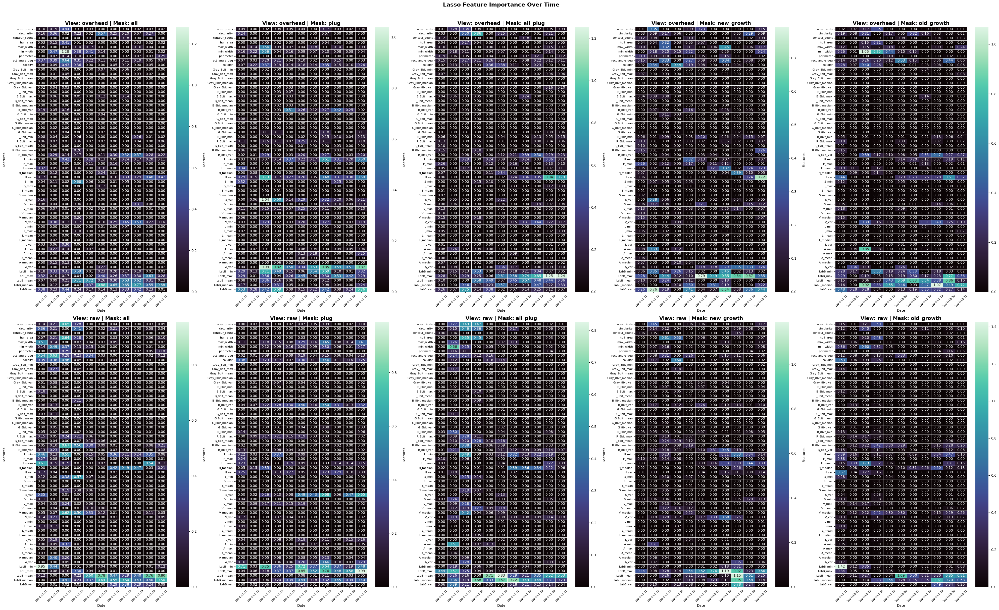

In [ ]:
#region plotting
views = imp_coef_lasso_df["view"].unique()
masks = imp_coef_lasso_df["mask_type"].unique()

fig, axes = plt.subplots(
    nrows=len(views), 
    ncols=len(masks), 
    figsize=(8 * len(masks), 12 * len(views))
)

# Ensure axes is always 2D
if len(views) == 1 and len(masks) == 1:
    axes = [[axes]]
elif len(views) == 1:
    axes = [axes]
elif len(masks) == 1:
    axes = [[ax] for ax in axes]

for row_idx, view_direction in enumerate(views):
    for col_idx, mask_type in enumerate(masks):
        ax = axes[row_idx][col_idx]

        imp_lasso_df_example = imp_coef_lasso_df[
            (imp_coef_lasso_df["view"] == view_direction) & 
            (imp_coef_lasso_df["mask_type"] == mask_type)
        ].copy()

        lasso_pivot = imp_lasso_df_example.pivot(
            index='feature_name', columns='date', values='mean_importance'
        )
        lasso_pivot = lasso_pivot[sorted(lasso_pivot.columns)]
        lasso_pivot_ordered = lasso_pivot.loc[trait_order]

        sns.heatmap(
            lasso_pivot_ordered,
            annot=True,
            fmt=".2f",
            cmap="mako",
            linewidths=0.5,
            linecolor="white",
            ax=ax
        )

        ax.set_title(f"View: {view_direction} | Mask: {mask_type}", 
                     fontsize=14, fontweight='bold')
        ax.set_ylabel("Features", fontsize=10)
        ax.set_xlabel("Date", fontsize=10)
        ax.tick_params(axis='x', rotation=45, labelsize=8)
        ax.tick_params(axis='y', rotation=0, labelsize=8)

plt.suptitle("Lasso Feature Importance Over Time", 
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()
#endregion

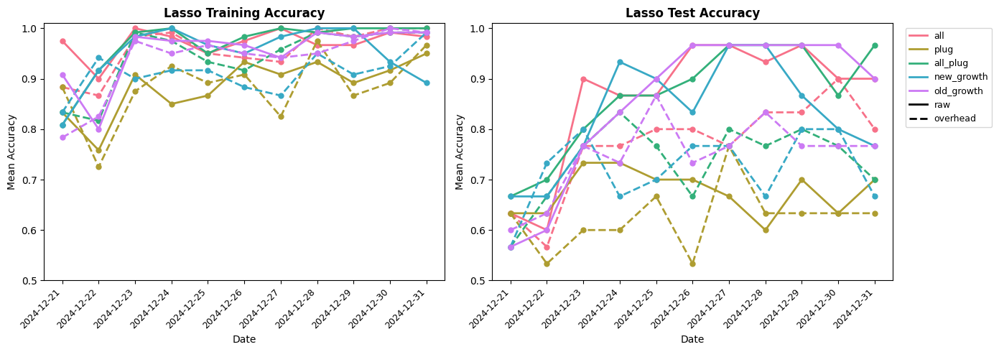

In [ ]:
#region plotting
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for mask_type in mask_order:
    for view_direction in view_order:
        subset = summary_lasso_df[
            (summary_lasso_df["mask_type"] == mask_type) &
            (summary_lasso_df["view"] == view_direction)
        ].sort_values("date")

        if subset.empty:
            continue

        label = f"{mask_type} / {view_direction}"
        color = mask_palette[mask_type]
        ls = view_linestyles[view_direction]

        axes[0].plot(
            subset["date"], subset["mean_train_acc"],
            marker="o", color=color, linestyle=ls, linewidth=2, markersize=5, label=label
        )
        axes[1].plot(
            subset["date"], subset["mean_test_acc"],
            marker="o", color=color, linestyle=ls, linewidth=2, markersize=5, label=label
        )

for ax, title in zip(axes, ["Lasso Training Accuracy", "Lasso Test Accuracy"]):
    ax.set_title(title, fontsize=12, fontweight="bold")
    ax.set_xlabel("Date", fontsize=10)
    ax.set_ylabel("Mean Accuracy", fontsize=10)
    ax.set_ylim(0.5, 1.02)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=9)

# Build legend: color patches for mask_type, linestyle handles for view
legend_handles = []
for mask_type in mask_order:
    legend_handles.append(
        Line2D([0], [0], color=mask_palette[mask_type], linewidth=2, label=mask_type)
    )
for view_direction, ls in view_linestyles.items():
    legend_handles.append(
        Line2D([0], [0], color="black", linestyle=ls, linewidth=2, label=view_direction)
    )

axes[1].legend(handles=legend_handles, bbox_to_anchor=(1.02, 1), loc="upper left", fontsize=9)

plt.tight_layout()
plt.show()
#endregion
